In [2]:
import numpy as np
import json
from pprint import pprint
import matplotlib.pyplot as plt
import matplotlib
from collections import defaultdict
import math

plt.rcParams['figure.figsize'] = [16, 4]
from plot_utils import *

In [3]:
def plot_one_pval_TE_final(ax,run_list,main_enum,pval_list,fname_pattern,debug_tidx,rr_lambda,reg_lambda,tmle_lambda,l2_lambda,noise,topic_name,tidx,hlayer=None,num_sample=None,plot_upto=-1,plot_per_idx=1):
    #Getting the result dict
    result_dict = get_all_result_dict(
                        run_list=run_list,
                        pval_list=pval_list,
                        enum=main_enum,
                        fname_pattern=fname_pattern.format(
                                                    "{1}",
                                                    num_sample,
                                                    hlayer,
                                                    "{0}",
                                                    debug_tidx,
                                                    rr_lambda,
                                                    reg_lambda,
                                                    tmle_lambda,
                                                    l2_lambda,
                                                    noise,
                                                    topic_name,
                        )
    )

    
    #Plotting the result
    for pidx,plot_item in enumerate(plot_item_list):
        
        #Plotting the results
        item_yval = np.array([result_dict[pval][plot_item]["mean"] for pval in pval_list])
        #yerr=[0.0]*len(item_yval)
        yerr = np.array([result_dict[pval][plot_item]["std"] for pval in pval_list])
        #Plotting the item
        
        ax[pidx].plot(pval_list,item_yval,label="topic={}".format(debug_tidx),ls="-.",marker="o",alpha=0.7)
        ax[pidx].fill_between(pval_list,item_yval-yerr,item_yval+yerr,alpha=0.3)
        ax[pidx].set_xlabel("expt")
        if "te" in plot_item:
            ax[pidx].set_ylim(-0.3,0.3)
        
        ax[pidx].set_ylabel(plot_item)
        
        ax[pidx].legend()
        ax[pidx].grid(True)

In [12]:
def plot_one_pval_TE_timeline(ax,run_list,main_enum,pval_list,fname_pattern,debug_tidx,rr_lambda,reg_lambda,tmle_lambda,l2_lambda,noise,topic_name,tidx,replace_strategy=None,gval_select_mode=None,hlayer=None,num_sample=None,plot_upto=-1,plot_per_idx=1,teulim=None,tellim=None,dcf=None,no_plot_mode=False):
    #Getting the metrics
    if "toy3" in fname_pattern:
        result_dict_timeline = get_all_result_timeline(
                            run_list=run_list,
                            pval_list=pval_list,
                            fname_pattern=fname_pattern.format(
                                                        "{1}",
                                                        num_sample,
                                                        hlayer,
                                                        "{0}",
                                                        debug_tidx,
                                                        rr_lambda,
                                                        reg_lambda,
                                                        tmle_lambda,
                                                        l2_lambda,
                                                        dcf,
                                                        noise,
                            )
        )
    elif "mnist" in fname_pattern:
        result_dict_timeline = get_all_result_timeline(
                            run_list=run_list,
                            pval_list=pval_list,
                            fname_pattern=fname_pattern.format(
                                                        "{1}",
                                                        num_sample,
                                                        hlayer,
                                                        "{0}",
                                                        debug_tidx,
                                                        rr_lambda,
                                                        reg_lambda,
                                                        tmle_lambda,
                                                        l2_lambda,
                                                        dcf,
                                                        noise,
                                                        topic_name,
                            )
        )
    elif gval_select_mode!=None:
        result_dict_timeline = get_all_result_timeline(
                            run_list=run_list,
                            pval_list=pval_list,
                            fname_pattern=fname_pattern.format(
                                                        "{1}",
                                                        num_sample,
                                                        hlayer,
                                                        "{0}",
                                                        debug_tidx,
                                                        rr_lambda,
                                                        reg_lambda,
                                                        tmle_lambda,
                                                        l2_lambda,
                                                        noise,
                                                        topic_name,
                                                        replace_strategy,
                                                        gval_select_mode,
                            )
        )
    elif replace_strategy!=None:
        result_dict_timeline = get_all_result_timeline(
                            run_list=run_list,
                            pval_list=pval_list,
                            fname_pattern=fname_pattern.format(
                                                        "{1}",
                                                        num_sample,
                                                        hlayer,
                                                        "{0}",
                                                        debug_tidx,
                                                        rr_lambda,
                                                        reg_lambda,
                                                        tmle_lambda,
                                                        l2_lambda,
                                                        noise,
                                                        topic_name,
                                                        replace_strategy,
                            )
        )
    else:
        result_dict_timeline = get_all_result_timeline(
                            run_list=run_list,
                            pval_list=pval_list,
                            fname_pattern=fname_pattern.format(
                                                        "{1}",
                                                        num_sample,
                                                        hlayer,
                                                        "{0}",
                                                        debug_tidx,
                                                        rr_lambda,
                                                        reg_lambda,
                                                        tmle_lambda,
                                                        l2_lambda,
                                                        noise,
                                                        topic_name,
                            )
        )
    
    if no_plot_mode==True:
        return result_dict_timeline

    for pidx,plot_item in enumerate(plot_item_list):
        for pval in pval_list:
            #Getting the timeline item
            item_pval_yval_timeline = result_dict_timeline[pval][plot_item]["mean"].tolist()
            yerr=[0.0]*len(item_pval_yval_timeline)
            xval = list(range(len(item_pval_yval_timeline)))

            #Plotting the item
            ax[pidx,tidx].errorbar(xval[:plot_upto][::plot_per_idx],item_pval_yval_timeline[:plot_upto][::plot_per_idx],yerr[:plot_upto][::plot_per_idx],label="pval={}".format(pval),ls="-.",marker="o",alpha=0.7)
#             ax[pidx,anidx].fill_between(pval_list,ylb,yub,alpha=0.2)

            ax[pidx,tidx].set_xlabel("epoch")
            ax[pidx,tidx].set_ylabel(plot_item)
            
            ax[pidx,tidx].set_xticks(xval[:plot_upto][::plot_per_idx])
            if "te" in plot_item and (teulim!=None and tellim!=None):
                ax[pidx,tidx].set_ylim(tellim,teulim)
            
            if "acc" in plot_item:
                ax[pidx,tidx].set_ylim(0.5,1.0)
            
#             if plot_item=="rr_loss_valid":
#                 ax[pidx,tidx].set_ylim(-10,0)
            
            if plot_item=="reg_loss_valid":
                ax[pidx,tidx].legend(loc=1)
            elif plot_item=="te_valid":
                ax[pidx,tidx].legend(loc=1)
            else:
                ax[pidx,tidx].legend()
            ax[pidx,tidx].grid(True)
            
            ax[pidx,tidx].set_title("topic={}, l2={}".format(topic_name,l2_lambda))
#             ax[pidx,tidx].set_title("l2_lambda="+str(l2_lambda))
            
            
#             plot_per_idx=plot_per_idx
#             ax[pidx,].errorbar(xval[:plot_upto][::plot_per_idx],item_pval_yval_timeline[:plot_upto][::plot_per_idx],yerr[:plot_upto][::plot_per_idx],label="pval={}".format(pval),ls="-.",marker="o",alpha=0.7)
#             #ax[pidx,anidx].fill_between(pval_list,ylb,yub,alpha=0.2)

#             ax[pidx,].set_xlabel("epoch")
#             ax[pidx,].set_ylabel(plot_item)

#             ax[pidx,].legend()
#             ax[pidx,].grid(True)
            
#             ax[pidx,].set_title("topic="+topic_name)
    return result_dict_timeline

In [5]:
def select_best_config(result_timeline_dict_hpdict,select_items_config,pval,preselect_best_item=None,best_item_order=None,last_pos_selection=None):
    '''
    This function will do ranking over multiple criteria based on the mean/sum of realtive rank of the 
    items we are considering (given in the select_item list).
    
    item1 : [ranked_list1]
    item2 : [ranked_list2]
    
    Then select the joint config with best mean raking. We are not slecting based on the sum/mean of values cuz
    the scale and the sensitivity of different items could be different.
    
    preselect_best_item : we will select the values after the best val of the current item is reached
    last_pos_selection  : when we are selecting the best among different item independently and the last pos will
                            will have the best config automatically. So we will get the max val of the item for a
                            hyperparam and add a dummy pos (last pos) now
    '''
    from collections import defaultdict
    
    #First of all we will get the best location of the best item (for which we have to do the preselection)
    if preselect_best_item!=None:
        hyp_bestitem_bestloc_dict={}
        for hyp in result_timeline_dict_hpdict.keys():
            #Getting the best item timeline for this hyperparameter
            best_item_timeline = result_timeline_dict_hpdict[hyp][pval][preselect_best_item]["mean"]

            #Getting the best loc for this hyperparameter
            if best_item_order=="desc":
                best_item_bestloc = np.argmax(best_item_timeline)
            else:
                best_item_bestloc = np.argmin(best_item_timeline)
            hyp_bestitem_bestloc_dict[hyp]=best_item_bestloc
    
        
    
    #Getting the ranked list of each of the items over which we have to optimize
    item_rank_dict = {}
    for item,order in select_items_config:
        #We need to select over the best item too to do selection over the hyperparams
        #assert item!=preselect_best_item, "We should not select again on the best item, preselection done"
        
        #Going over each of the hyperparameter one by one
        item_vals = []
        for hyp in result_timeline_dict_hpdict.keys():
            #Getting the val list
            val_timeline = result_timeline_dict_hpdict[hyp][pval][item]["mean"].tolist()
            num_epochs = len(val_timeline)
            
            #Now if we want to do selection after certain location then slice
            idx_offset=0
            if preselect_best_item!=None:
                idx_offset = hyp_bestitem_bestloc_dict[hyp]
                val_timeline = val_timeline[idx_offset:]
                
            
            #Now creating the val list with the loc and val
            if last_pos_selection==True:
                item_hyp_val = np.max(val_timeline) if order=="desc" else np.min(val_timeline)
                item_vals += [(hyp,num_epochs-1,item_hyp_val)]
            else:
                item_vals += [(hyp,idx_offset+idx,val) for idx,val in enumerate(val_timeline)]
            
        #Sorting the item based on the criteria selected
        reverse_order = True if order=="desc" else False
        item_vals.sort(reverse=reverse_order,key=lambda x: x[-1])
            
        #Getting the ranking dict of each position/iteration from which we have to select
        rank_dict = {(hyp,idx):rank for rank,(hyp,idx,_) in enumerate(item_vals)}
        item_rank_dict[item]=rank_dict
        
    #Now merging the ranking to get the best location
    pos_avg_rank_dict = defaultdict(int)
    for item in item_rank_dict.keys():
        for hyp,idx in item_rank_dict[item].keys():
            pos_avg_rank_dict[(hyp,idx)]+=item_rank_dict[item][(hyp,idx)]
        
    #Getting the the position with minimum sum of rank (best ranks)
    pos_avg_rank_list = [(hyp,idx,rsum) for (hyp,idx),rsum in pos_avg_rank_dict.items()]
    pos_avg_rank_list.sort(key=lambda x: x[-1])
    
#     print("best location:= hyp:{}, pos:{}, rsum:{}".format(pos_avg_rank_list[0][0],pos_avg_rank_list[0][1],pos_avg_rank_list[0][2]))
#     print("top five location: ",pos_avg_rank_list[0:5])
    
    return pos_avg_rank_list[0]

In [6]:
def get_avg_te_from_metaruns(pval_list,result_timeline_dict_hpdict,best_gval_rr_mode):
    '''
    These modes will be controlled by differet rnums manually right now
    te_mode : de_acc = normal without rr loss, selection based on acc
              de_loss = normal without rr loss, selection based on loss
              
              sel_de_acc : de with rr_loss with selection by accuracy
              sel_dr_acc : dr with rr_loss
              
              sel_de_loss : de with rr_loss with selection by val loss
              sel_dr_loss : dr with rr_loss with seleciton by val loss
              
    best_gval_rr_mode : in this mode we use the lost pos for selection
    '''
    #GEtting the averate te over the meta run list
    for pval in pval_list:
        print("\n\n===================================================================")
        print("TE for pval=",pval)
        print("===================================================================")
        est_te_list_dict = defaultdict(list)
        for rnum in result_timeline_dict_hpdict.keys():
            #<>de_acc
            de_acc_bconfig = select_best_config(result_timeline_dict_hpdict[rnum],
                               select_items_config=[
            #                                ("rr_loss_valid","inc"),
            #                                ("reg_loss_valid","inc"),
                                           ("reg_acc_valid","desc"),
                               ],
                               pval=pval,
                               last_pos_selection=best_gval_rr_mode,
            )
            est_te_list_dict["de_acc"].append(result_timeline_dict_hpdict[rnum][de_acc_bconfig[0]][pval]["te_valid"]["mean"][de_acc_bconfig[1]])

            
            
            
            
            #<>dr_acc
            dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict[rnum],
                               select_items_config=[
                                           ("rr_loss_valid","inc"),
            #                                ("reg_loss_valid","inc"),
                                           ("reg_acc_valid","desc"),
                               ],
                               pval=pval,
                               last_pos_selection=best_gval_rr_mode,
            )
            est_te_list_dict["dr_acc"].append(result_timeline_dict_hpdict[rnum][dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]])


    
    
    
    
    
    
            #<>de_acc
            de_reg_bconfig = select_best_config(result_timeline_dict_hpdict[rnum],
                               select_items_config=[
            #                                ("rr_loss_valid","inc"),
                                           ("reg_loss_valid","inc"),
            #                                ("reg_acc_valid","desc"),
                               ],
                               pval=pval,
                               last_pos_selection=best_gval_rr_mode,
            )
            est_te_list_dict["de_loss"].append(result_timeline_dict_hpdict[rnum][de_reg_bconfig[0]][pval]["te_valid"]["mean"][de_reg_bconfig[1]])


            
            
            
            
            
            #<>dr_loss
            dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict[rnum],
                               select_items_config=[
                                           ("rr_loss_valid","inc"),
                                           ("reg_loss_valid","inc"),
            #                                ("reg_acc_valid","desc"),
                               ],
                               pval=pval,
                               last_pos_selection=best_gval_rr_mode,
            )
            #print("alpha:tdtidx1-tcf0:{}".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["alpha:tdtidx1-tcf0"]["mean"][dr_reg_bconfig[1]]))
            #print("alpha:tdtidx1-tcf1:{}".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["alpha:tdtidx1-tcf1"]["mean"][dr_reg_bconfig[1]]))
            est_te_list_dict["dr_loss"].append(result_timeline_dict_hpdict[rnum][dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]])
            
        #Finally merging he results from multiple runs
        for te_key in est_te_list_dict.keys():
            print("all_te_list=",est_te_list_dict[te_key])
            print("{}={}\n".format(te_key,round(np.mean(est_te_list_dict[te_key]),2)))
        

# Toy3 Dataset

## Only gval

In [91]:
meta_run_list=[9,10,11]
main_enum=1000
hlayer=1

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0]#,0.1,1.0,10.0,100.0,200.0,1000.0]
# debug_tidx_list=[0,1]
num_sample=1000 #500, 460,340,320
debug_tidx=0
pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
# degree_confoundedness=0.0
noise=0.0
dcf=1.0
topic_name="causal" #causal or spurious or confound


plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for tidx,l2_lambda in enumerate(l2_lambda_list):
        if topic_name=="spurious":
            fname_pattern= "dataset/nlp_toy3/nlp_logs/cad.toy3s1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf({}).noise({})/probe_metric_list.json"
        elif topic_name=="causal":
            fname_pattern= "dataset/nlp_toy3/nlp_logs/cad.toy3s1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf({}).noise({}).topic(causal)/probe_metric_list.json"
        else:
            raise NotImplementedError()
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=None,
                               tidx=tidx,
                               dcf=dcf,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=None,
                               teulim=None,
                               tellim=0.0,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )

get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=False,
)



TE for pval= 0.5
all_te_list= [0.28447455167770386, 0.3267911672592163, 0.3223601281642914]
de_acc=0.31

all_te_list= [0.2924017906188965, 0.29605531692504883, 0.32369565963745117]
dr_acc=0.3

all_te_list= [0.2905714213848114, 0.28176698088645935, 0.18054670095443726]
de_loss=0.25

all_te_list= [0.3188565671443939, 0.29605531692504883, 0.32509011030197144]
dr_loss=0.31



TE for pval= 0.6
all_te_list= [0.2978307902812958, 0.3152015209197998, 0.2628984749317169]
de_acc=0.29

all_te_list= [0.3224788308143616, 0.32718098163604736, 0.309154212474823]
dr_acc=0.32

all_te_list= [0.2948821187019348, 0.29238268733024597, 0.30777695775032043]
de_loss=0.3

all_te_list= [0.31855306029319763, 0.32718098163604736, 0.3055395781993866]
dr_loss=0.32



TE for pval= 0.7
all_te_list= [0.3084636628627777, 0.1719386726617813, 0.336812824010849]
de_acc=0.27

all_te_list= [0.32029420137405396, 0.3659918010234833, 0.3882971405982971]
dr_acc=0.36

all_te_list= [0.2970418334007263, 0.3100028932094574, 0.3036

Bad pipe message: %s [b'\xc0\xf5\x9a\xfd\xe0\x186\x0f#\x9c\x9cu\x19\x19\x0c\xd5\xcbd \xcbKM\x8a)\xb6\xa1\x83\xbe;\xa6p)!{50\xc0<\x80Z(\x1b\xc1]r#\x0c\xd0\xa2\xe5B\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16']
Bad pipe message: %s [b'\xb71\xde\x07\x08\xe2\xbc#\xba\xd1\x87\xb9\xe2\xe6~\xde\x85\xdf \xd66\xd3k\xed\xed\xa8X\x8c\x19t3Ac=\xd8\xbc6\x05e{zt\xc0a-k\xd7\xb6\x0b\xef\x8e\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00+\x00\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 I\x11\xea\\\x11

Bad pipe message: %s [b'\x07\x914\xfc\xa00\x7f@}\x1c\x1e\x03\ns\xd6\xdf\x04T \xe3\x8d\xbaY\xc191\xc4o\xf0\xd6\xbd\xfc\xc8\xa5\xad\x1f\x9cF#\xd9\xb7\xb0\xa8od\xe1\xfe\xe7\x9aP\xad\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00']
Bad pipe message: %s [b'\xfb|8}\xd2\x18YF\x95\xca\xbdc\x80\xa7\xa47\x02B \xd7\xcd\xe2\xe5z\xe2\xf4\xa3\x03g\x95\x13\xd3\xb8~\xfb', b'\xe9\xda\x00\x9a\xe2\xdf\xdcD\xee\x05\xe4\xd6gj\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08', b'\x06\x04\x01\x05']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\xb8\xf7|\xbe9^2<\x82\x89\x8bB\xc8\xdbC\xe9\xde\x0c\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\

Bad pipe message: %s [b'`\xa6\x0b\x1d\xa1\xd9\xc4`[\x7f\xb3|$\xf2|)\xa6\xe0 \xa7\xd3\x8d\xc9IJ\xc6\xa4\xbd\xb1\xb7eC\xce\x98g\x86\xd3\x88\x02sw\xaa5']
Bad pipe message: %s [b'\xac!\xfe\x15\xba\x15\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00', b'\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07']
Bad pipe message: %s [b'\x08\t\x08\n\x08\x0b\x08']
Bad pipe message: %s [b'\x05\x08\x06']
Bad pipe message: %s [b'\x05\x01\x06', b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 Q\xfe\xeabz2\x83~_\xd0\x04&\xca\x80R\x07Q\x03\n\x0b\xc20']
Bad pipe message: %s [b'I\x8c\x1f8\xeb\xec\xdc\xf4{\xde\xd1\x0f\xf0\x05\xd6n\xfd\x02\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc

Bad pipe message: %s [b'5i\xac\xd1$Z\x00\x1c\x0bR-\xe3\xcb\x0c\x0eu\x84', b"_p\x8c\x8bE\x14\xa1\xb8U\xd4`_\xb51\xda\\'\xdd)i\xae\xf8&l)\xb7[u\xb4\x15\x83\xb5\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00+\x00\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d"]
Bad pipe message: %s [b'\xba\xe5d*\x96\xc2\\vD\xe1o|\x17\x80B\x19\xe2R\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0', b"+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13\x003\x002\x00\x9d\xc0\xa1\xc0\x9d\xc0Q\x00\x9c\xc0\xa0\xc0\x9c\xc0

Bad pipe message: %s [b'Un\xf6\x94\x87$b\x96\x94\xe6x\xe9\x8a\xfe[\xfb\x02\x08 D\xa7C\xf3\xcc\xa4\xa6']
Bad pipe message: %s [b'\x83\xc66\xda\xfdpQ\x07\x8b\xf0\x91W\xf4}t\xd2x\x05\x04\xb9\xf8?\x97\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03']
Bad pipe message: %s [b'\x06\x03\x08\x07', b'\x08\t\x08\n\x08\x0b\x08']
Bad pipe message: %s [b'\x05\x08\x06']
Bad pipe message: %s [b'\x05\x01\x06', b'']
Bad pipe message: %s [b"\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 8\xed\xe3\xf8\xbeQ-+EP\xff'x\xe8\xf5<'*\xf1\xc3\xd0]"]
Bad pipe message: %s [b'Y\x98[huK\x15\xcd\xd6\x1d\xbc\x17\xba+)\x18T\xd6\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2']
Bad pipe message: %s [b'\x80\xd2

## gval and alpha selection

In [85]:
meta_run_list=[15,16,17] #15,16,17, acc    ==== 12,13,14 loss
main_enum=200
hlayer=1

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0]#,0.1,1.0,10.0,100.0,200.0,1000.0]
# debug_tidx_list=[0,1]
num_sample=1000 #500, 460,340,320
debug_tidx=0
pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
# degree_confoundedness=0.0
noise=0.0
dcf=1.0
topic_name="causal"


plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
            "alpha:tdtidx1-tcf0",
            "alpha:tdtidx1-tcf1",
]

if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for tidx,l2_lambda in enumerate(l2_lambda_list):
        if topic_name=="spurious":
            fname_pattern= "dataset/nlp_toy3/nlp_logs/cad.toy3s1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf({}).noise({})/probe_metric_list.json"
        elif topic_name=="causal":
            fname_pattern= "dataset/nlp_toy3/nlp_logs/cad.toy3s1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf({}).noise({}).topic(causal)/probe_metric_list.json"
        else:
            raise NotImplementedError()
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=None,
                               tidx=tidx,
                               dcf=dcf,
                               plot_upto=200,
                               plot_per_idx=10,
                               replace_strategy=None,
                               teulim=None,
                               tellim=0.0,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )

    
get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=True,
)



TE for pval= 0.5
all_te_list= [0.41200393438339233, 0.21982768177986145, 0.3460924029350281]
de_acc=0.33

all_te_list= [0.3817266821861267, 0.20457647740840912, 0.16489604115486145]
dr_acc=0.25

all_te_list= [0.41200393438339233, 0.21982768177986145, 0.3460924029350281]
de_loss=0.33

all_te_list= [0.3817266821861267, 0.20457647740840912, 0.16489604115486145]
dr_loss=0.25



TE for pval= 0.6
all_te_list= [0.27091845870018005, 0.2411516159772873, 0.3088011145591736]
de_acc=0.27

all_te_list= [0.39909034967422485, 0.19852618873119354, 0.1889360547065735]
dr_acc=0.26

all_te_list= [0.27091845870018005, 0.2411516159772873, 0.3088011145591736]
de_loss=0.27

all_te_list= [0.39909034967422485, 0.19852618873119354, 0.1889360547065735]
dr_loss=0.26



TE for pval= 0.7
all_te_list= [0.31371819972991943, 0.2546710968017578, 0.2978293299674988]
de_acc=0.29

all_te_list= [0.3941003978252411, 0.170362651348114, 0.20091477036476135]
dr_acc=0.26

all_te_list= [0.31371819972991943, 0.2546710968017578,

## no alpha and gval selection

In [81]:
meta_run_list=[18,19,20]
main_enum=200
hlayer=1

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0] #,0.1,1.0,10.0,100.0,200.0,1000.0]
# debug_tidx_list=[0,1]
num_sample=1000 #500, 460,340,320
debug_tidx=0
pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
# degree_confoundedness=0.0
noise=0.0
dcf=0.0


plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]

if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for tidx,l2_lambda in enumerate(l2_lambda_list):
        fname_pattern= "dataset/nlp_toy3/nlp_logs/cad.toy3s1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf({}).noise({})/probe_metric_list.json"
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=None,
                               tidx=tidx,
                               dcf=dcf,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=None,
                               teulim=None,
                               tellim=0.0,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )

    
    
get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=False,
)



TE for pval= 0.5
all_te_list= [-0.03289932757616043, -0.02568311244249344, 0.03843060880899429]
de_acc=-0.01

all_te_list= [-0.02916727215051651, -0.00867190770804882, 0.055266596376895905]
dr_acc=0.01

all_te_list= [-0.030904598534107208, -0.046061959117650986, 0.03271147608757019]
de_loss=-0.01

all_te_list= [-0.02778656780719757, -0.015722231939435005, 0.055266596376895905]
dr_loss=0.0



TE for pval= 0.6
all_te_list= [0.024546794593334198, -0.023291777819395065, 0.06471921503543854]
de_acc=0.02

all_te_list= [-0.0415550172328949, -0.06302139908075333, 0.0862429141998291]
dr_acc=-0.01

all_te_list= [-0.050227485597133636, -0.032572243362665176, 0.06471921503543854]
de_loss=-0.01

all_te_list= [-0.042376793920993805, -0.054238900542259216, 0.0938853845000267]
dr_loss=-0.0



TE for pval= 0.7
all_te_list= [0.02232949435710907, 0.023943006992340088, 0.025373462587594986]
de_acc=0.02

all_te_list= [-0.03606982156634331, -0.07123380154371262, 0.10818751156330109]
dr_acc=0.0

all_te_lis

# MNIST34 dataset

## only gval

In [20]:
meta_run_list=[9,10,11]
main_enum=1000
hlayer=1

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0,0.1,1.0,10.0,100.0,200.0,1000.0]
# debug_tidx_list=[0,1]
num_sample=1000 #500, 460,340,320
debug_tidx=0
pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
# degree_confoundedness=0.0
noise=0.3
dcf=0.0
topic_name="rotation" #causal or spurious or confound


plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for tidx,l2_lambda in enumerate(l2_lambda_list):
        fname_pattern= "dataset/mnist/nlp_logs/cad.mnists1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf({}).noise({}).topic({})/probe_metric_list.json"
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=topic_name,
                               tidx=tidx,
                               dcf=dcf,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=None,
                               teulim=None,
                               tellim=0.0,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )

get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=False,
)



TE for pval= 0.5
all_te_list= [0.05529140308499336, -0.0313749797642231, 0.032230306416749954]
de_acc=0.02

all_te_list= [0.0533028282225132, -0.03630206733942032, 0.032230302691459656]
dr_acc=0.02

all_te_list= [0.04666342958807945, -0.03129325434565544, 0.032438185065984726]
de_loss=0.02

all_te_list= [0.0533028282225132, 0.0016239238902926445, 0.01577334851026535]
dr_loss=0.02



TE for pval= 0.6
all_te_list= [0.06334303319454193, 0.006601336877793074, 0.03732913359999657]
de_acc=0.04

all_te_list= [0.06334303319454193, -0.004924452863633633, 0.05465174838900566]
dr_acc=0.04

all_te_list= [0.057648446410894394, 0.007477851584553719, 0.027995996177196503]
de_loss=0.03

all_te_list= [0.06334303319454193, -0.004924452863633633, 0.060820963233709335]
dr_loss=0.04



TE for pval= 0.7
all_te_list= [0.06441723555326462, 0.008916838094592094, 0.07736534625291824]
de_acc=0.05

all_te_list= [0.10813233256340027, 0.030605530366301537, 0.0655488446354866]
dr_acc=0.07

all_te_list= [0.06855687

Bad pipe message: %s [b'\xda\xdc\xc7Z\xa3\xa9\xf3\xae\xd2\xa0\nN-^\x83\xb4\xce\x0f ]J\x1eb\x9d\x9e\x9d\xcby\xe9$\x1c\x1e:\x13\x94\xe4G\x885\xc2{GAh3\xe5\xb0W+\xbd3\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00+\x00\x03\x02\x03\x04\x00-\x00\x02\x01']
Bad pipe message: %s [b'']
Bad pipe message: %s [b"\x13^f\xe1\xa25\xf4I\xdc\x83\x9esat\xdc\xb4\x88\xc1\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#\xc0'\x00g\x00@\xc0\n\xc0\x14\x009\x008\xc0\t\xc0\x13\x003\x002\x00\x9d\xc0\xa1\xc0\x9d\xc0Q\x00\x9c\xc0\xa0\

## gval and alpha selection

In [19]:
meta_run_list=[12,13,14] #15,16,17, acc    ==== 12,13,14 loss
main_enum=200
hlayer=1

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0,0.1,1.0,10.0,100.0,200.0,1000.0]
# debug_tidx_list=[0,1]
num_sample=1000 #500, 460,340,320
debug_tidx=0
pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
# degree_confoundedness=0.0
noise=0.3
dcf=0.0
topic_name="rotation"


plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
            "alpha:tdtidx1-tcf0",
            "alpha:tdtidx1-tcf1",
]

ax=None
if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for tidx,l2_lambda in enumerate(l2_lambda_list):
        fname_pattern= "dataset/mnist/nlp_logs/cad.mnists1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf({}).noise({}).topic({})/probe_metric_list.json"
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=topic_name,
                               tidx=tidx,
                               dcf=dcf,
                               plot_upto=200,
                               plot_per_idx=10,
                               replace_strategy=None,
                               teulim=None,
                               tellim=0.0,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )

    
get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=True,
)



TE for pval= 0.5
all_te_list= [0.00430653989315033, -0.022092396393418312, 0.02911885641515255]
de_acc=0.0

all_te_list= [0.10359179228544235, 0.13947632908821106, 0.0761224776506424]
dr_acc=0.11

all_te_list= [0.00430653989315033, -0.022092396393418312, -0.010887091048061848]
de_loss=-0.01

all_te_list= [0.09489281475543976, 0.13947632908821106, 0.0761224776506424]
dr_loss=0.1



TE for pval= 0.6
all_te_list= [-0.024874407798051834, -0.05018636956810951, 0.04063877463340759]
de_acc=-0.01

all_te_list= [0.08607761561870575, 0.055119872093200684, 0.09952418506145477]
dr_acc=0.08

all_te_list= [0.07698587328195572, -0.05018636956810951, 0.13942381739616394]
de_loss=0.06

all_te_list= [0.08607761561870575, 0.055119872093200684, 0.15719696879386902]
dr_loss=0.1



TE for pval= 0.7
all_te_list= [0.01417740061879158, 0.06388767063617706, 0.21662162244319916]
de_acc=0.1

all_te_list= [-0.040714457631111145, 0.06184973195195198, 0.1318756639957428]
dr_acc=0.05

all_te_list= [0.01417740061879

## no gval and alpha selection

In [ ]:
meta_run_list=[18,19,20]
main_enum=200
hlayer=1

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0] #,0.1,1.0,10.0,100.0,200.0,1000.0]
# debug_tidx_list=[0,1]
num_sample=1000 #500, 460,340,320
debug_tidx=0
pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
# degree_confoundedness=0.0
noise=0.0
dcf=0.0


plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]

if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for tidx,l2_lambda in enumerate(l2_lambda_list):
        fname_pattern= "dataset/nlp_toy3/nlp_logs/cad.toy3s1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf({}).noise({})/probe_metric_list.json"
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=None,
                               tidx=tidx,
                               dcf=dcf,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=None,
                               teulim=None,
                               tellim=0.0,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )

    
    
get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=False,
)

# CeBAB Dataset

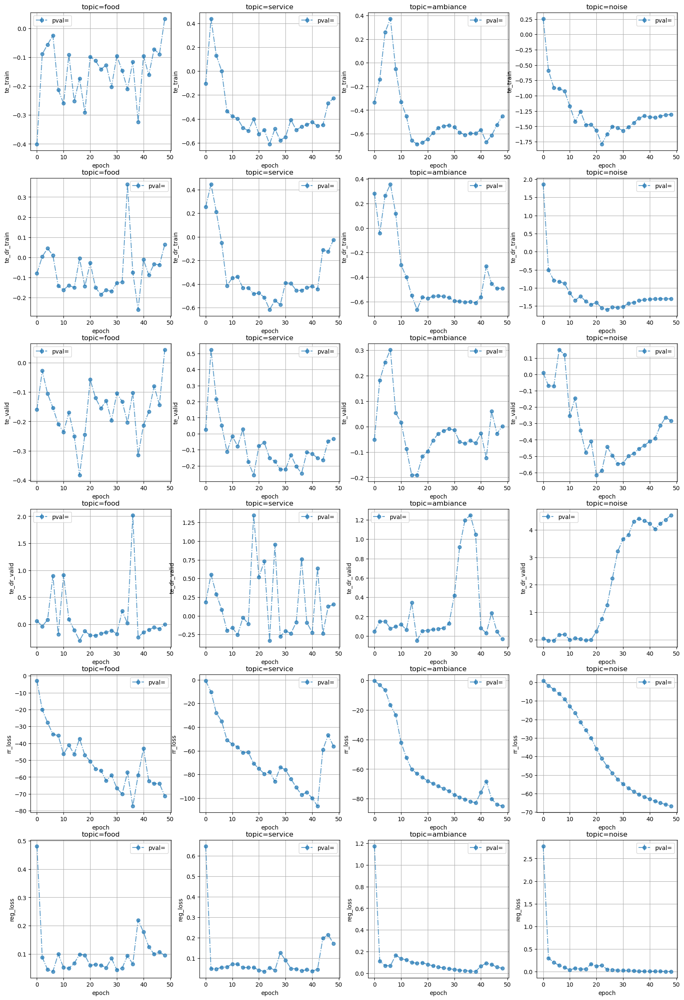

In [23]:
run_list=[1,]
main_enum=50
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda=0.0
# debug_tidx_list=[0,1]
topic_list=["food","service","ambiance","noise"]
num_sample_list=[750,500,200,65]
debug_tidx=0

pval_list=[""]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "reg_loss",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [20, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pvaltsp({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
    )
    tidx+=1

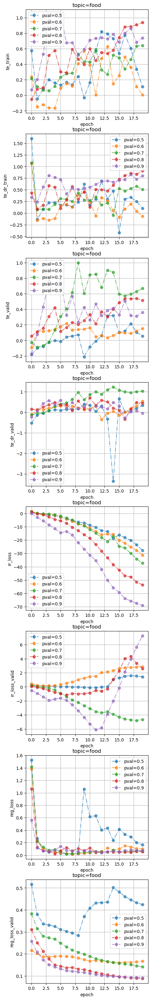

In [24]:
run_list=[3,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda = 0.0
# debug_tidx_list=[0,1]
topic_list=["food",]
num_sample_list=[350,]
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=20,
                           plot_per_idx=1,
    )
    tidx+=1

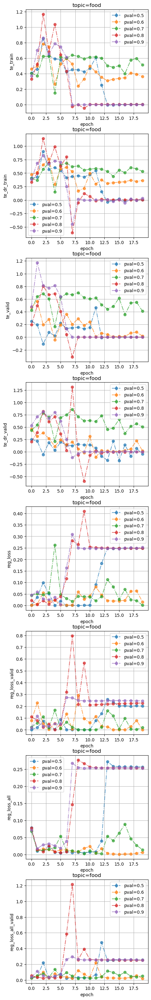

In [20]:
run_list=[5,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda = 0.0
# debug_tidx_list=[0,1]
topic_list=["food",]
num_sample_list=[350,]
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
#             "rr_loss",
#             "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_loss_all",
            "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=20,
                           plot_per_idx=1,
    )
    tidx+=1

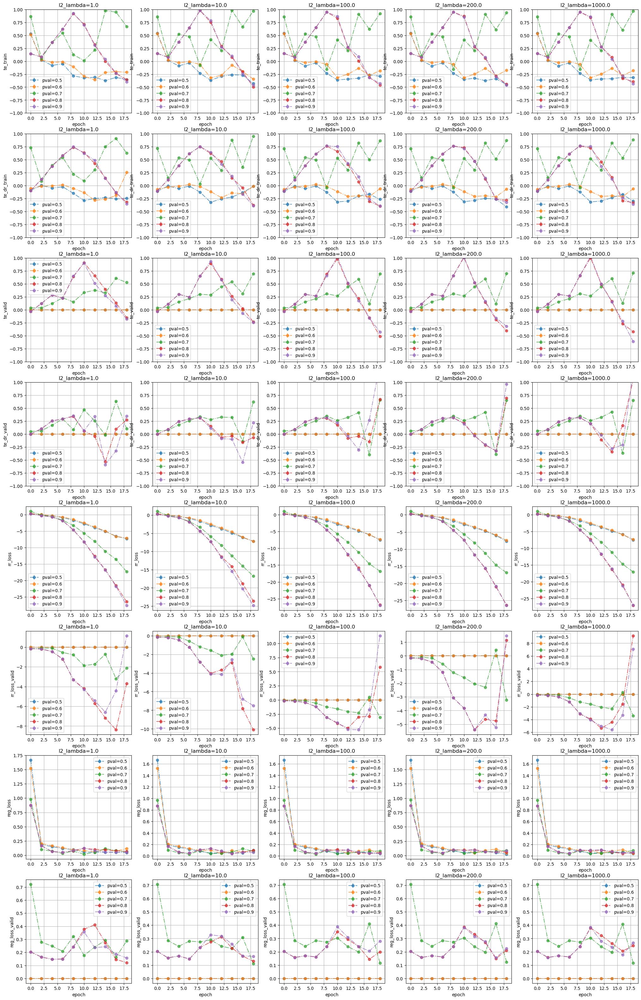

Bad pipe message: %s [b':\rte\x95 c\x8f\xe8\t\x01\xd6O\xde\xf0\xc3T\x10 F\x14C\x87\xe1\xfaa\x1c\x89\xe0h\xcd\xe9\x89\xc3\xe5\xafm\xd6\x0b{\x14\xe9vv\xf53L]%\xa5\x01\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t1', b'.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04', b'\x03\x06', b'\x07\x08']
Bad pipe message: %s [b'\t\x08\n\x08\x0b\x08\x04']
Bad pipe message: %s [b'\x08\x06\x04\x01\x05\x01\x06', b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 P\x07\x0eQg\xe7\xa3(`1\xe3M\x9d6\x15S\xfe\x84[A\xb1\xdc']
Bad pipe message: %s [b'\xbd\xb1\x0bHM\xeaYCI\xe4\xf8\xb6+\x13"\x84[o\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\xc0V\xc0R\xc0$\xc0(\x00k\x00j\xc0#

In [30]:
run_list=[8,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[1.0,10.0,100.0,200.0,1000.0]
topic_name="noise"
num_sample=50
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
    )

## After symmetrization of CEBAB dataset

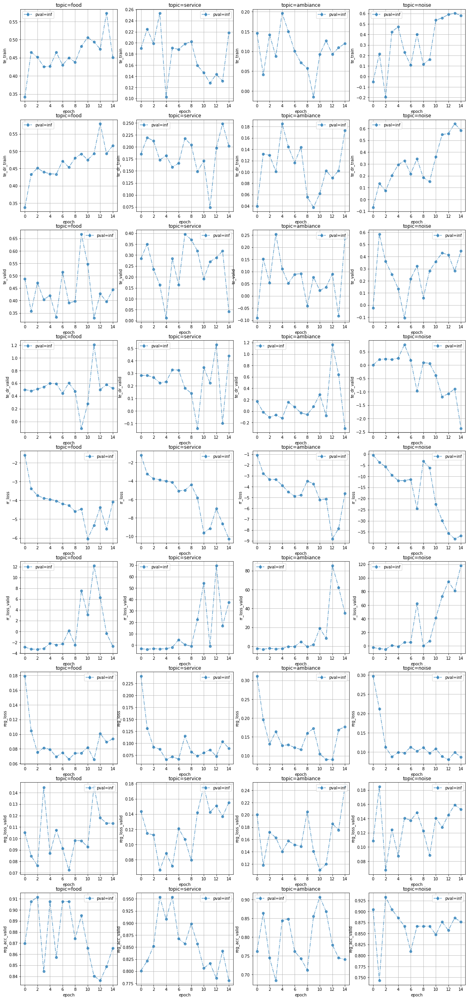

In [49]:
run_list=[8,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda = 0.0
# debug_tidx_list=[0,1]
topic_list=["food","service","ambiance","noise"]
num_sample_list=[1100,900,700,500]
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [20, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=15,
                           plot_per_idx=1,
                           replace_strategy=None,
    )
    tidx+=1

best location:= hyp:200.0, pos:2, rsum:0
top five location:  [(200.0, 2, 0), (1000.0, 6, 1), (10.0, 4, 2), (100.0, 5, 3), (1.0, 3, 4)]
DE: 0.4512007534503937


best location:= hyp:100.0, pos:2, rsum:10
top five location:  [(100.0, 2, 10), (0.0, 2, 11), (1000.0, 2, 17), (0.0, 1, 19), (200.0, 2, 19)]
DR_reg_acc: 0.5139641761779785


best location:= hyp:0.0, pos:2, rsum:8
top five location:  [(0.0, 2, 8), (0.0, 1, 11), (200.0, 3, 11), (10.0, 4, 17), (200.0, 2, 18)]
DR_acc_acc: 0.5097017884254456




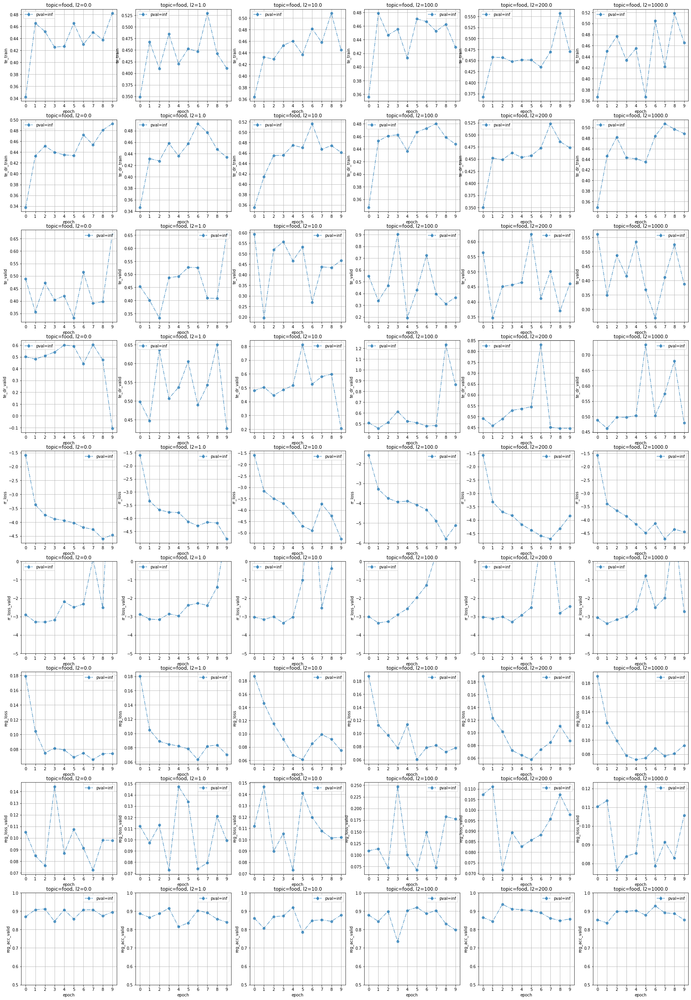

In [69]:
run_list=[8,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="food"#["food","service","ambiance","noise"]
num_sample=1100 #[1100,900,700,500] #the one with symmetrization
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict={}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda] = plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=10,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    

pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
)
print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
)
print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## Without summetrization + bce/mse loss

best location:= hyp:0.0, pos:9, rsum:0
top five location:  [(0.0, 9, 0), (100.0, 7, 1), (100.0, 8, 2), (200.0, 9, 3), (100.0, 9, 4)]
DE: 0.0006337761878967285


best location:= hyp:0.0, pos:9, rsum:0
top five location:  [(0.0, 9, 0), (200.0, 9, 5), (100.0, 8, 6), (100.0, 7, 6), (0.0, 7, 10)]
DR_reg_acc: 0.015768354758620262


best location:= hyp:200.0, pos:9, rsum:3
top five location:  [(200.0, 9, 3), (0.0, 9, 4), (100.0, 7, 5), (100.0, 8, 7), (100.0, 6, 10)]
DR_acc_acc: 0.009953925386071205




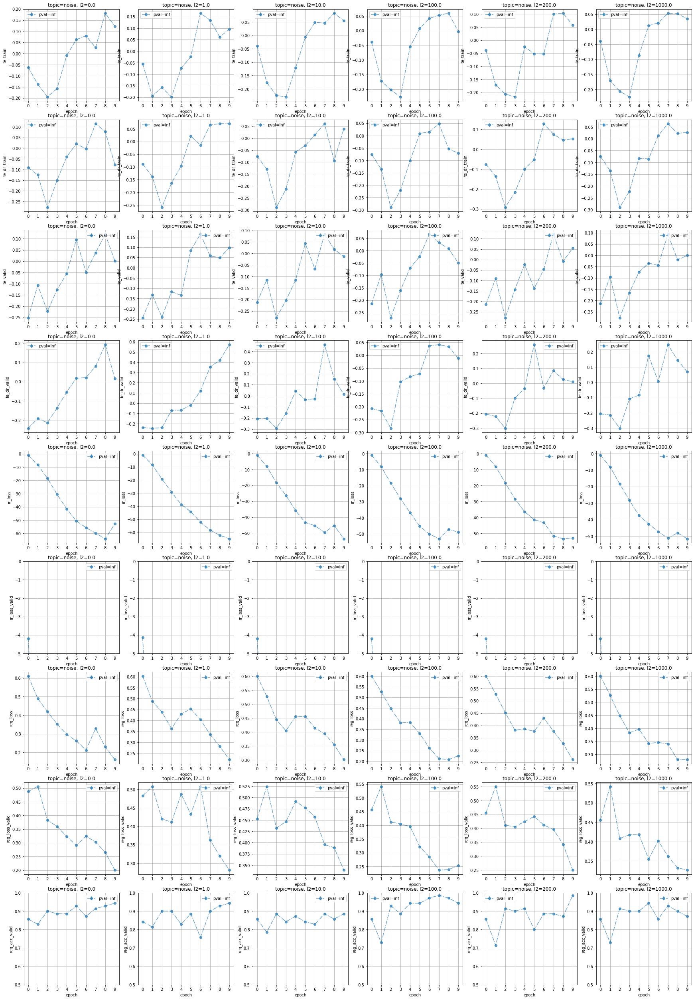

Bad pipe message: %s [b"0\x18'\x19{\n\xfd7\xe2\xe3q\xef\xd2\x86\x8d\xe4\r| \x13A4\xd9H\xb4\xc1wj\x10\xcc\xa0\x8dy\xc4\xa1\x8ef\xdb\ra=T\x1f\x96*\x826h\xa9\x1b>\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00"]
Bad pipe message: %s [b'\x0c\x00\x00\t127.0.0.1']
Bad pipe message: %s [b'\xcb\xfc \x9d\xf5\xc6o\x054\xa6R\x99\x1b=\xec\x1c!\xbc j\xa2s\x19,\xd0\xf7\x9f\xbaQ\xf2\xbc\xa1\x9e\xc3\xf3\xf8of[\x1dP\xc2\xff\xd2a\x7f\x1d\x02\x04\x1en\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06\x01\x00+\x00\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \xdbohG\x13\x9d\xf79B\x03\xea\x80I4B&\xaba\xe1\xcfr\x87\xcc\xb0\x0f\xb7\xf9\xc2&v\xd3z']
Bad pipe messa

In [102]:
run_list=[8,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="noise"#["food","service","ambiance","noise"]
num_sample=320 #500, 460,340,320
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = {}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).regmode(bce)/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=10,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    
    
pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
)
print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
)
print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## Hashing the best alpha

best location:= hyp:1.0, pos:4, rsum:0
top five location:  [(1.0, 4, 0), (200.0, 4, 1), (0.0, 3, 2), (0.0, 9, 3), (1.0, 3, 4)]
DE: 0.39796382188796997


best location:= hyp:0.0, pos:3, rsum:9
top five location:  [(0.0, 3, 9), (1.0, 4, 10), (100.0, 3, 11), (1.0, 5, 12), (0.0, 2, 15)]
DR_reg_acc: 0.4511515498161316


best location:= hyp:100.0, pos:3, rsum:8
top five location:  [(100.0, 3, 8), (0.0, 3, 9), (1.0, 4, 10), (0.0, 2, 12), (1.0, 3, 12)]
DR_acc_acc: 0.42006635665893555




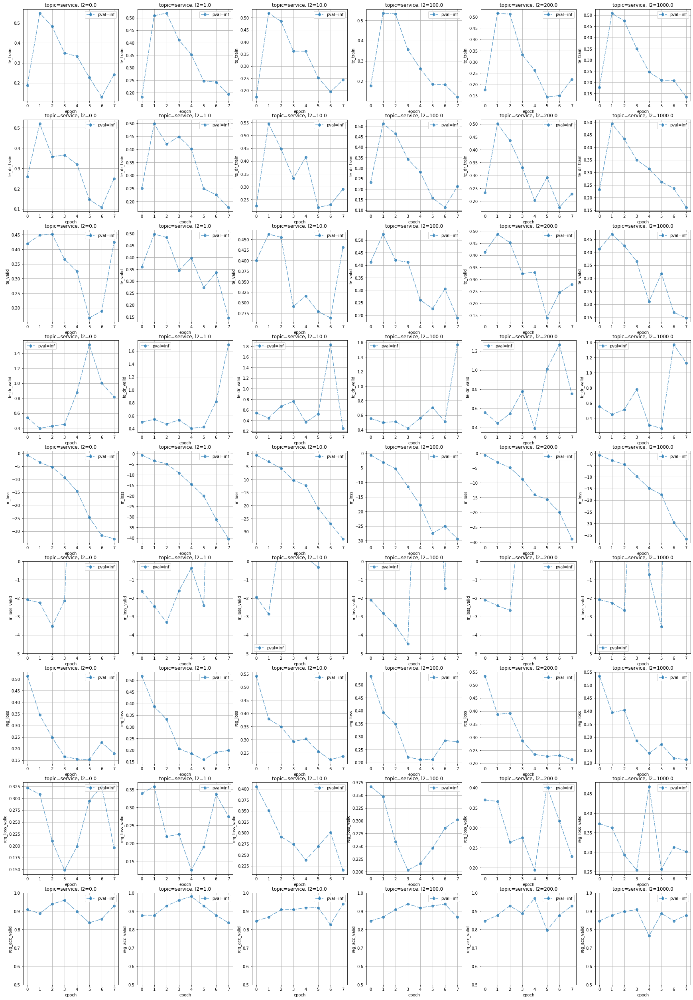

In [103]:
run_list=[11,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="service"#["food","service","ambiance","noise"]
num_sample=460 #500, 460,340,320
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = {}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).regmode(bce)/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=8,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    
    
pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
)
print("DE: {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
                   preselect_best_item = "rr_loss_valid",
                   best_item_order = "inc",
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))


dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
                   preselect_best_item = "rr_loss_valid",
                   best_item_order = "inc",
)
print("DR_acc_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))

## No alpha and gval selection

best location:= hyp:1.0, pos:18, rsum:0
top five location:  [(1.0, 18, 0), (1000.0, 19, 1), (0.0, 8, 2), (0.0, 10, 3), (0.0, 15, 4)]
DE(acc): 0.7236724495887756


best location:= hyp:200.0, pos:14, rsum:16
top five location:  [(200.0, 14, 16), (0.0, 10, 29), (10.0, 19, 33), (0.0, 8, 34), (1000.0, 17, 39)]
DR_reg_acc: 0.003742903470993042


best location:= hyp:0.0, pos:16, rsum:0
top five location:  [(0.0, 16, 0), (0.0, 15, 1), (1000.0, 16, 2), (0.0, 17, 3), (1000.0, 15, 4)]
DE(loss): 0.5203248858451843


best location:= hyp:1000.0, pos:16, rsum:5
top five location:  [(1000.0, 16, 5), (1000.0, 15, 6), (1000.0, 14, 10), (1000.0, 17, 11), (200.0, 14, 13)]
DR_reg_loss: -0.03962548449635506




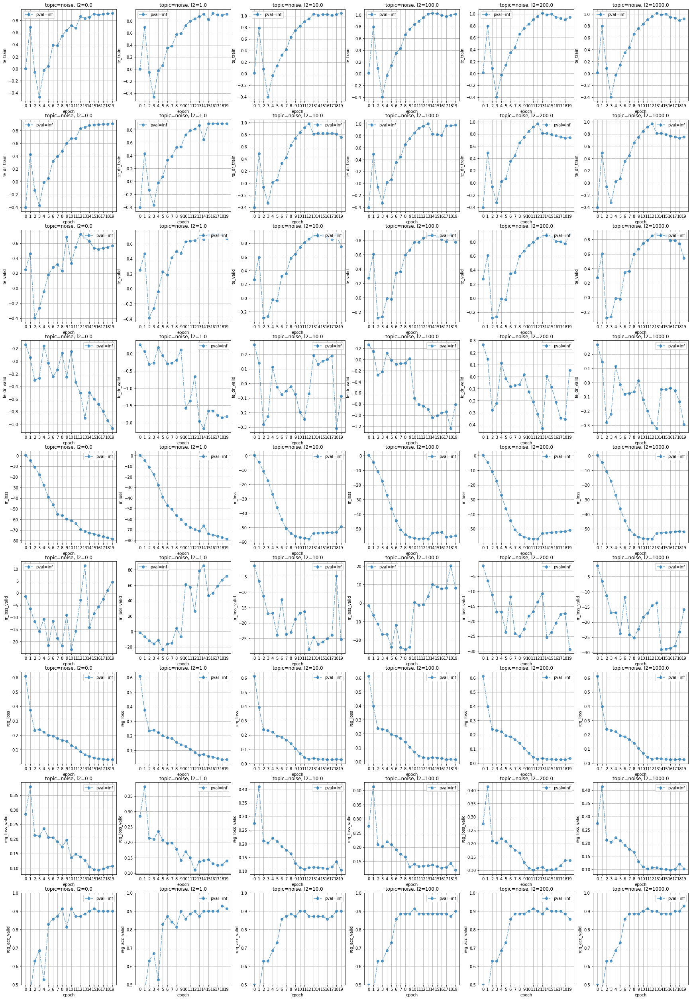

Bad pipe message: %s [b'\xdb1u\xcbW\xa2\xd8\xe0\xc5X\x14\x04]\xec\xcf\x99#\x9c \x7f\x811\x88|\xc9S\xd3\xf4\xdc\x8d\xae\xd5{\x1a\x85-"\x94\xd1\xaav;\x1c\xc6\xb5\x9d\xc2\x920 \xd7\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08\x0b\x08\x04\x08', b'\x06\x04\x01\x05']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 U.Lo\x90\xf8=\x06\xbc\x84\xa3\xc5\x87\xb2\xe4j\xa2h\xc4B\x85\x0c']
Bad pipe message: %s [b"D\xae-\x81E/\xfe\xac\xa1\xd5\x95\xb8\x13\x10\x82\xf3gd\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\xc0\xac\xc0\xa2\xc0\x9e\xc0\\\xc0`\

In [82]:
run_list=[20,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="noise"#["food","service","ambiance","noise"]
num_sample=320 #500, 460,340,320
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = {}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).regmode(mse)/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=20,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    
    
pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
#                    last_pos_selection=True,
)
print("DE(acc): {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
#                    last_pos_selection=True,
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))




#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
#                    last_pos_selection=True,
)
print("DE(loss): {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))


dr_loss_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
#                    last_pos_selection=True
)
print("DR_reg_loss: {}\n\n".format(result_timeline_dict_hpdict[dr_loss_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_loss_bconfig[1]]))

## Choosing both the gval and the alpha independently

best location:= hyp:200.0, pos:19, rsum:0
top five location:  [(200.0, 19, 0), (100.0, 19, 1), (1000.0, 19, 2), (1.0, 19, 3), (10.0, 19, 4)]
DE(acc): 1.296699047088623


best location:= hyp:200.0, pos:19, rsum:1
top five location:  [(200.0, 19, 1), (1000.0, 19, 2), (100.0, 19, 3), (1.0, 19, 6), (0.0, 19, 9)]
DR_reg_acc: 1.2436423301696777


best location:= hyp:200.0, pos:19, rsum:0
top five location:  [(200.0, 19, 0), (1000.0, 19, 1), (100.0, 19, 2), (10.0, 19, 3), (1.0, 19, 4)]
DE(loss): 1.296699047088623


best location:= hyp:1000.0, pos:19, rsum:1
top five location:  [(1000.0, 19, 1), (200.0, 19, 1), (100.0, 19, 4), (1.0, 19, 7), (10.0, 19, 8)]
DR_reg_loss: 1.3183705806732178




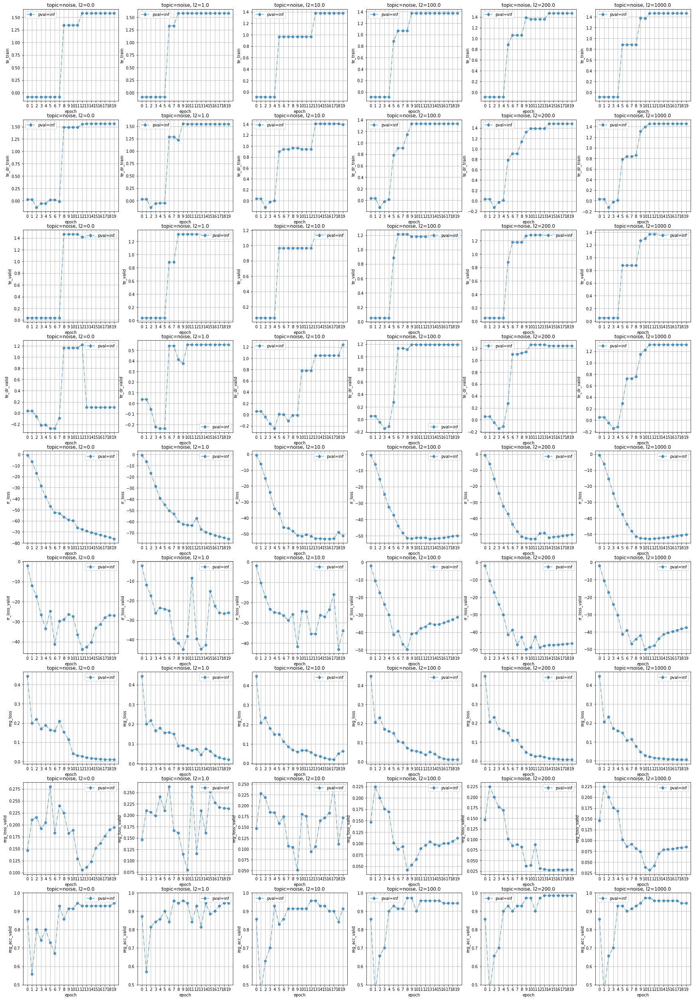

In [79]:
run_list=[17,]
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list = [0.0, 1.0, 10.0, 100.0, 200.0, 1000.0]
# debug_tidx_list=[0,1]
topic_name="noise"#["food","service","ambiance","noise"]
num_sample=320 #500, 460,340,320
debug_tidx=0


pval_list=["inf"]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "reg_loss_all",
#             "reg_loss_all_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))

result_timeline_dict_hpdict = {}
for tidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).regmode(mse)/probe_metric_list.json"
    result_timeline_dict_hpdict[l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=20,
                           plot_per_idx=1,
                           replace_strategy=None,
                           teulim=None,
                           tellim=0.0,
    )

    
    
pval="inf"
#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
                   last_pos_selection=True,
)
print("DE(acc): {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))


dr_acc_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
#                                ("reg_loss_valid","inc"),
                               ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
                   last_pos_selection=True
)
print("DR_reg_acc: {}\n\n".format(result_timeline_dict_hpdict[dr_acc_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_acc_bconfig[1]]))



#Selecting the best hyperparameter
de_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
#                                ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval=pval,
                   last_pos_selection=True,
)
print("DE(loss): {}\n\n".format(result_timeline_dict_hpdict[de_bconfig[0]][pval]["te_valid"]["mean"][de_bconfig[1]]))



dr_reg_bconfig = select_best_config(result_timeline_dict_hpdict,
                   select_items_config=[
                               ("rr_loss_valid","inc"),
                               ("reg_loss_valid","inc"),
#                                ("reg_acc_valid","desc"),
                   ],
                   pval="inf",
                   last_pos_selection=True,
)
print("DR_reg_loss: {}\n\n".format(result_timeline_dict_hpdict[dr_reg_bconfig[0]][pval]["te_dr_valid"]["mean"][dr_reg_bconfig[1]]))

## Which expt is this

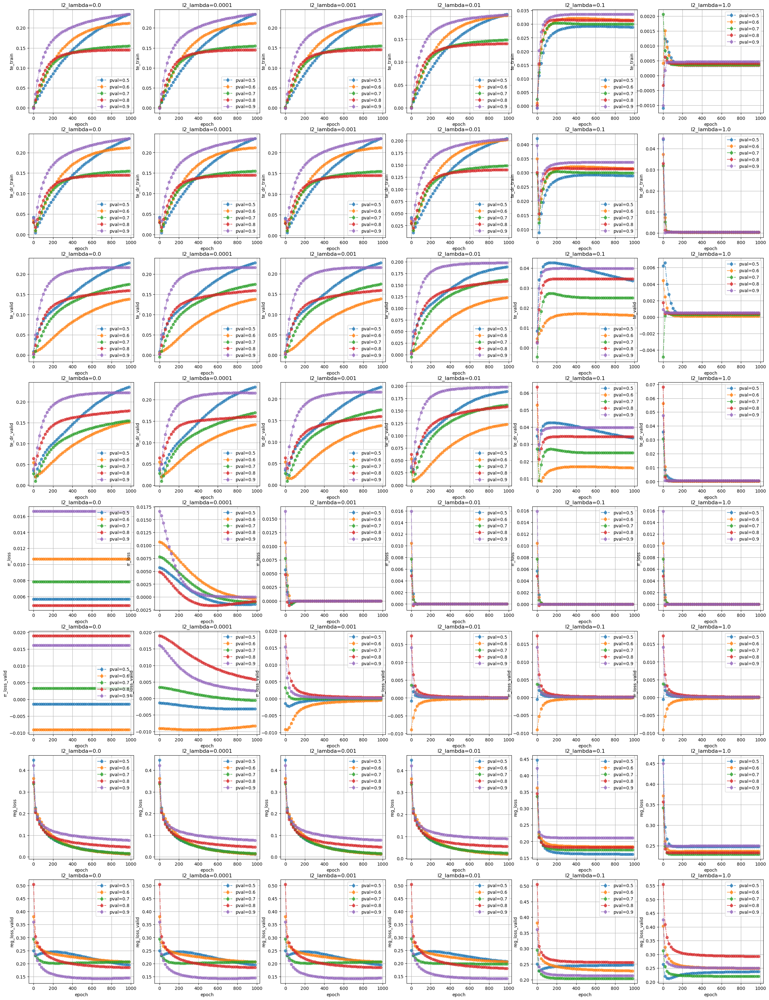

In [11]:
run_list=[4,]
main_enum=1000
hlayer=0

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,0.0001,0.001,0.01,0.1,1.0]#20.0,100.0,200.0,1000.0]
topic_name="food"
num_sample=350
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=1000,
                           plot_per_idx=10,
    )

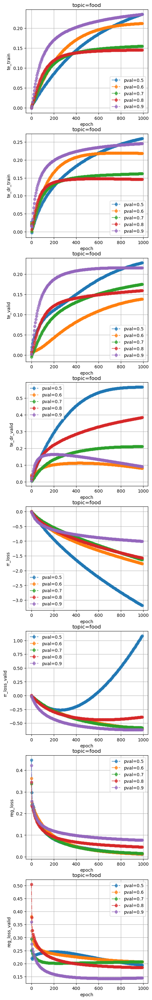

In [16]:
run_list=[4,]
main_enum=1000
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda=0.0
# debug_tidx_list=[0,1]
topic_list=["food",]
num_sample_list=[350,]
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9]
# degree_confoundedness=0.0

noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5, 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(topic_list))

tidx=0
for topic_name,num_sample in zip(topic_list,num_sample_list):
    fname_pattern= "dataset/cebab/nlp_logs/cad.cebabs1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=tidx,
                           plot_upto=-1,
    )
    tidx+=1

# CivilComments Dataset

TypeError: plot_one_pval_TE_timeline() missing 1 required positional argument: 'replace_strategy'

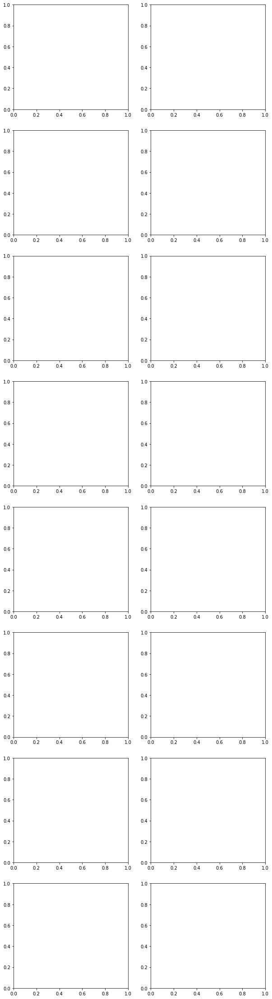

In [53]:
run_list=[8,]
main_enum=5
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,0.0]
topic_name="race"
num_sample=5000
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
    )

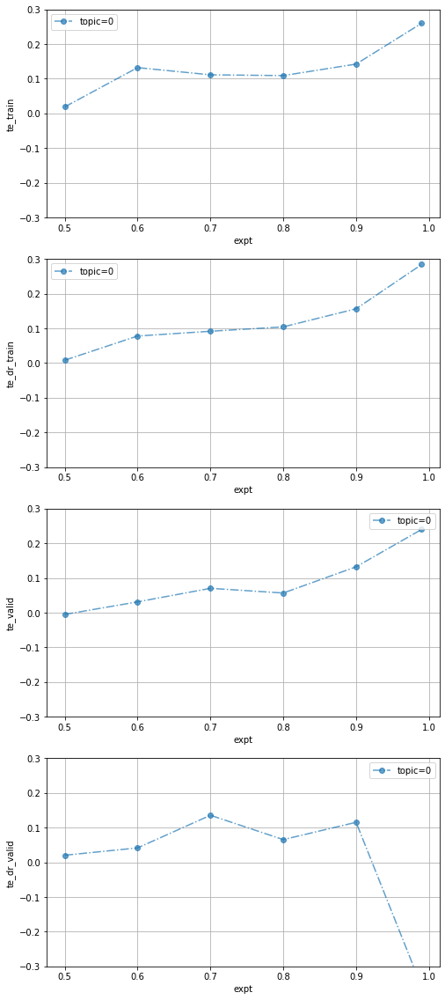

Bad pipe message: %s [b'\xffn\xf1\xa0T\xff\xe5H\x96\x9c\x02z\xc8\xf0:\x94G\xe6 \x11K_~=\xd0\x04\xe1\x0c\x9f4l?\x16\xde\xcd\xdbk\xa1y9r\x8bO\xd5\x80\xbb=\xe8u\xcdu\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06\x03\x08\x07\x08\x08\x08\t\x08\n\x08', b'\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \x16\xde\xf2\x16RBS\x82L\x0b\xee\xd9k?]0\xaf\xf7\xc9\xeb\xe7|']
Bad pipe message: %s [b'\xc7\x00\x08>\xe9@\xc1\xb4&\xbb\xeak-H\x8f\xb2\xe3F \xffS\xb2\x9d7\xdfqg\x1e\xdb\x83\xa8Q\x18F\x8f\xb11', b'\x891&\x8dx\xcf\x04\x82\xc3\xa4R\xf6\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\

Bad pipe message: %s [b"\x919\x0evp\xb2\xdc\xcb4\r\xbd\x7f\xe2\xb3\xe4\x12\xdf: \xdb|'\x84\xc54jj?\xb9LB~.\xc6\x91\x1a\xfb\xd3\xb4\x94\xe9\x1f\xd4J\x9d3\xf8/\xf0\x94\xa1\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00", b'\x17\x00\x1e\x00\x19\x00\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05']
Bad pipe message: %s [b'\x03\x08']
Bad pipe message: %s [b'\x08\x08\t\x08\n\x08']
Bad pipe message: %s [b'\x04\x08\x05\x08\x06\x04\x01\x05\x01\x06']
Bad pipe message: %s [b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \xe3+\x95\x9b\x18\xd9\xbb\x9b\x97%+\x81\xa1I\x1f\x12\xe4\xfc\x94\xcc\xb5\xc8']
Bad pipe message: %s [b"}\xf3\xbdRv!\x06\xda\xe6\xd5\x93-\\[Q\xa34\x13\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f\xcc\xa9\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\x9e\xc0\xae\x

In [31]:
run_list=[8,]
# main_enum=2
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
# l2_lambda_list=[0.0,0.0]
l2_lambda=0.0
topic_name="gender"
num_sample=5000
debug_tidx=0

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
#             "rr_loss",
#             "rr_loss_valid",
#             "reg_loss",
#             "reg_loss_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [8,5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list))


# for lidx,l2_lambda in enumerate(l2_lambda_list):
fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({})/probe_metric_list.json"
plot_one_pval_TE_final(ax=ax,
                       run_list=run_list,
                       num_sample=num_sample,
                       pval_list=pval_list,
                       hlayer=hlayer,
                       main_enum=main_enum,
                       fname_pattern=fname_pattern,
                       debug_tidx=debug_tidx,
                       rr_lambda=rr_lambda,
                       reg_lambda=reg_lambda,
                       tmle_lambda=tmle_lambda,
                       l2_lambda=l2_lambda,
                       noise=noise,
                       topic_name=topic_name,
                       tidx=lidx,
                       plot_upto=20,
                       plot_per_idx=1,
)

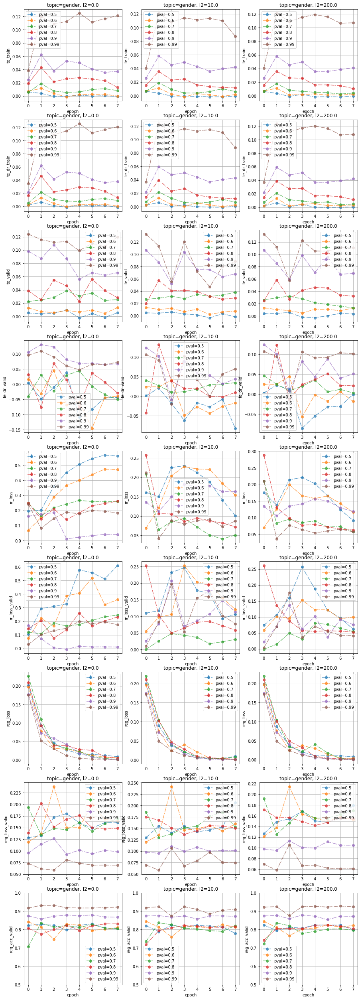

Bad pipe message: %s [b' $\x18\x97\xac\xf2\xf7Q\xb9\x1f\x99\xaeh\x9aZ\xdf\xdf\xb9 o`\xe7\x13\xc1t\x17\x87\x15\xf8\xa0\x0fn\xbc\xa3\t\xf1/l\rP\x9d\x17}\x85\x03\x18~NT\x83\x03\x00\x08\x13\x02\x13\x03\x13\x01\x00\xff\x01\x00\x00\x8f\x00\x00\x00\x0e\x00\x0c\x00\x00\t127.0.0.1\x00\x0b\x00\x04\x03\x00\x01\x02\x00\n\x00\x0c\x00\n\x00\x1d\x00\x17\x00\x1e\x00']
Bad pipe message: %s [b'\x18\x00#\x00\x00\x00\x16\x00\x00\x00\x17\x00\x00\x00\r\x00\x1e\x00\x1c\x04\x03\x05\x03\x06']
Bad pipe message: %s [b'\x07\x08']
Bad pipe message: %s [b'\t\x08\n\x08\x0b\x08\x04']
Bad pipe message: %s [b'\x08\x06\x04\x01\x05\x01\x06', b'']
Bad pipe message: %s [b'\x03\x02\x03\x04\x00-\x00\x02\x01\x01\x003\x00&\x00$\x00\x1d\x00 \xcc\x99.x\xdf\xfc\x1au^X\x9f@"\xdb\x91\x16\x1e\xfbP\xae\x1aK']
Bad pipe message: %s [b'/\x8c\xb3\x10=\xcb?\xa8.\xcc\xd9=\xa1\xd3b\xca`\xdc\x00\x00|\xc0,\xc00\x00\xa3\x00\x9f']
Bad pipe message: %s [b"\xcc\xa8\xcc\xaa\xc0\xaf\xc0\xad\xc0\xa3\xc0\x9f\xc0]\xc0a\xc0W\xc0S\xc0+\xc0/\x00\xa2\x00\

In [17]:
run_list=[8,]
main_enum=5
hlayer=0

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,10.0,200.0]
topic_name="gender"
num_sample=5000
debug_tidx=0
replace_strategy="remove"

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


for lidx,l2_lambda in enumerate(l2_lambda_list):
    fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).dcf().noise({}).topic({}).replace_strategy({})/probe_metric_list.json"
    plot_one_pval_TE_timeline(ax=ax,
                           run_list=run_list,
                           num_sample=num_sample,
                           pval_list=pval_list,
                           hlayer=hlayer,
                           main_enum=main_enum,
                           fname_pattern=fname_pattern,
                           debug_tidx=debug_tidx,
                           rr_lambda=rr_lambda,
                           reg_lambda=reg_lambda,
                           tmle_lambda=tmle_lambda,
                           l2_lambda=l2_lambda,
                           noise=noise,
                           topic_name=topic_name,
                           tidx=lidx,
                           plot_upto=20,
                           plot_per_idx=1,
                           replace_strategy=replace_strategy,
    )

## only gval

In [67]:
meta_run_list=[1,11,21]#with gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,1.0,10.0,100.0,200.0,1000.0]
topic_name="race" # race, gender, religion
num_sample=5000  # 5000, 5000, 4000
debug_tidx=0
replace_strategy="remove"
gval_select_mode="acc" #loss,acc

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]

ax=None
if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for lidx,l2_lambda in enumerate(l2_lambda_list):
        fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=topic_name,
                               tidx=lidx,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=replace_strategy,
                               gval_select_mode=gval_select_mode,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )
    

get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=False,
)



TE for pval= 0.5
all_te_list= [0.02354285679757595, 0.02750258520245552, 0.023028768599033356]
de_acc=0.02

all_te_list= [0.010081569664180279, 0.013654019683599472, 0.006978659890592098]
dr_acc=0.01

all_te_list= [0.020745396614074707, 0.012681195512413979, 0.02290845289826393]
de_loss=0.02

all_te_list= [0.01028759777545929, 0.013066551648080349, 0.026255842298269272]
dr_loss=0.02



TE for pval= 0.6
all_te_list= [0.05154809355735779, 0.036957040429115295, 0.042826440185308456]
de_acc=0.04

all_te_list= [0.038609277456998825, 0.04161130636930466, 0.05418277531862259]
dr_acc=0.04

all_te_list= [0.055772922933101654, 0.0253167524933815, 0.03896448388695717]
de_loss=0.04

all_te_list= [0.03622406721115112, 0.04404054209589958, 0.05206560343503952]
dr_loss=0.04



TE for pval= 0.7
all_te_list= [0.06584934145212173, 0.07346042990684509, 0.06856073439121246]
de_acc=0.07

all_te_list= [0.06672646105289459, 0.046981390565633774, 0.08919350802898407]
dr_acc=0.07

all_te_list= [0.05631301552

## with gval and alpha selection

In [66]:
meta_run_list=[0,10,20]#with gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,1.0,10.0,100.0,200.0,1000.0]
topic_name="race" #race, gender, religion
num_sample=5000 #5000, 5000, 4000
debug_tidx=0
replace_strategy="remove"
gval_select_mode="loss" #loss,acc

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


ax=None
if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for lidx,l2_lambda in enumerate(l2_lambda_list):
        fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=topic_name,
                               tidx=lidx,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=replace_strategy,
                               gval_select_mode=gval_select_mode,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )
    

get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=True,
)



TE for pval= 0.5
all_te_list= [0.09705638140439987, 0.04619497060775757, 0.07849844545125961]
de_acc=0.07

all_te_list= [0.015093984082341194, 0.00705804955214262, 0.07118669897317886]
dr_acc=0.03

all_te_list= [0.08746710419654846, 0.02133263647556305, 0.07849844545125961]
de_loss=0.06

all_te_list= [0.07297345250844955, 0.013930399902164936, 0.07118669897317886]
dr_loss=0.05



TE for pval= 0.6
all_te_list= [0.08758477866649628, 0.07121247053146362, 0.10669159889221191]
de_acc=0.09

all_te_list= [0.08534835278987885, 0.07784485071897507, 0.06589841097593307]
dr_acc=0.08

all_te_list= [0.08758477866649628, 0.09978171437978745, 0.07237973809242249]
de_loss=0.09

all_te_list= [0.08534835278987885, 0.07784485071897507, 0.06589841097593307]
dr_loss=0.08



TE for pval= 0.7
all_te_list= [0.0978437289595604, 0.10355710238218307, 0.027594832703471184]
de_acc=0.08

all_te_list= [0.08834896236658096, 0.12283073365688324, 0.05590931698679924]
dr_acc=0.09

all_te_list= [0.09848401695489883, 0.

## without gval and alpha selection

In [65]:
meta_run_list=[1,11,21]#without the best gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,1.0,10.0,100.0,200.0,1000.0]
topic_name="religion" #race, gender,religion
num_sample=4000
debug_tidx=0
replace_strategy="remove"
gval_select_mode="acc" #loss,acc (any random default name is chosen here)

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


ax=None
if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for lidx,l2_lambda in enumerate(l2_lambda_list):
        fname_pattern= "dataset/civilcomments/nlp_logs/cad.civils1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=topic_name,
                               tidx=lidx,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=replace_strategy,
                               gval_select_mode=gval_select_mode,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )
    

get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=False,
)



TE for pval= 0.5
all_te_list= [0.016308462247252464, 0.03422887250781059, -0.009807947091758251]
de_acc=0.01

all_te_list= [-0.011684286408126354, 0.025800270959734917, -0.005326947197318077]
dr_acc=0.0

all_te_list= [0.030229104682803154, 0.02363506332039833, -0.004747544415295124]
de_loss=0.02

all_te_list= [-0.011684286408126354, 0.025800270959734917, -0.005326947197318077]
dr_loss=0.0



TE for pval= 0.6
all_te_list= [0.02753020077943802, 0.0390804186463356, -0.008039409294724464]
de_acc=0.02

all_te_list= [0.0064992462284862995, 0.041389599442481995, 0.016680780798196793]
dr_acc=0.02

all_te_list= [0.01167359109967947, 0.06165579706430435, 0.03337956592440605]
de_loss=0.04

all_te_list= [0.0362241193652153, 0.04732153192162514, 0.013036617077887058]
dr_loss=0.03



TE for pval= 0.7
all_te_list= [0.047401729971170425, 0.020663250237703323, 0.023929772898554802]
de_acc=0.03

all_te_list= [0.03717319667339325, 0.034494709223508835, 0.014881325885653496]
dr_acc=0.03

all_te_list= [0

# AAE dataset with chatgpt cf

## only gval training 

In [20]:
meta_run_list=[1,11,21]#with gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=0
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,1.0,10.0,100.0,1000.0]
topic_name="race"
num_sample=10000
debug_tidx=0
replace_strategy="gpt3"
gval_select_mode="loss" #loss,acc

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.0

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))



result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for lidx,l2_lambda in enumerate(l2_lambda_list):
        fname_pattern= "dataset/twitter_aae_sentiment_race/nlp_logs/cad.aaes1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=topic_name,
                               tidx=lidx,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=replace_strategy,
                               gval_select_mode=gval_select_mode,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )
    

get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=False,
)



TE for pval= 0.5
all_te_list= [0.023055387660861015, 0.00973422173410654, 0.008675466291606426]
de_acc=0.01

all_te_list= [0.017462627962231636, 0.005102620925754309, 0.00011012655158992857]
dr_acc=0.01

all_te_list= [0.008531239815056324, 0.00973422173410654, 0.008675466291606426]
de_loss=0.01

all_te_list= [0.01567707397043705, 0.005102620925754309, -0.0021181791089475155]
dr_loss=0.01



TE for pval= 0.6
all_te_list= [0.07961153984069824, 0.0613948218524456, 0.06845444440841675]
de_acc=0.07

all_te_list= [0.07968060672283173, 0.11903946101665497, 0.09254152327775955]
dr_acc=0.1

all_te_list= [0.0796458050608635, 0.06832758337259293, 0.07043566554784775]
de_loss=0.07

all_te_list= [0.07968060672283173, 0.08889248222112656, 0.0850818082690239]
dr_loss=0.08



TE for pval= 0.7
all_te_list= [0.11568224430084229, 0.10447867214679718, 0.13992047309875488]
de_acc=0.12

all_te_list= [0.15087518095970154, 0.14527276158332825, 0.18708451092243195]
dr_acc=0.16

all_te_list= [0.11293993145227

## with gval and alpha selection

In [39]:
meta_run_list=[0,10,20]#with gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,10.0,100.0,200.0,1000.0]
topic_name="race"
num_sample=10000
debug_tidx=0
replace_strategy="gpt3"
gval_select_mode="acc" #loss,acc

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.1

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]




ax=None
if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for lidx,l2_lambda in enumerate(l2_lambda_list):
        if run_num==0 and noise==0.0:
            fname_pattern= "dataset/twitter_aae_sentiment_race/nlp_logs/cad.aaes1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}.tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
        else:
            fname_pattern= "dataset/twitter_aae_sentiment_race/nlp_logs/cad.aaes1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
        
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=topic_name,
                               tidx=lidx,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=replace_strategy,
                               gval_select_mode=gval_select_mode,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )
    

get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=True,
)



TE for pval= 0.5
all_te_list= [-0.0015276415506377816, 0.04162798449397087, -0.017845412716269493]
de_acc=0.01

all_te_list= [0.01111171767115593, 0.06446846574544907, -0.013829396106302738]
dr_acc=0.02

all_te_list= [0.004098806995898485, 0.04162798449397087, -0.005082724150270224]
de_loss=0.01

all_te_list= [0.01111171767115593, 0.06446846574544907, -0.013829396106302738]
dr_loss=0.02



TE for pval= 0.6
all_te_list= [0.08380007743835449, 0.09893453121185303, 0.06246202066540718]
de_acc=0.08

all_te_list= [0.04634286090731621, 0.10828978568315506, 0.07537820190191269]
dr_acc=0.08

all_te_list= [0.06690477579832077, 0.03718428313732147, 0.05867487192153931]
de_loss=0.05

all_te_list= [0.04634286090731621, 0.06016703322529793, 0.06319762021303177]
dr_loss=0.06



TE for pval= 0.7
all_te_list= [0.057604894042015076, 0.13431377708911896, 0.08057131618261337]
de_acc=0.09

all_te_list= [0.12549160420894623, 0.11076642572879791, 0.08301188051700592]
dr_acc=0.11

all_te_list= [0.0576048940

## without best gval and alpha selection

In [34]:
run_list=[1,11,21]#without the best gval and alpha selection
main_enum=20
hlayer=0

rr_lambda=1
reg_lambda=1
tmle_lambda=0
l2_lambda_list=[0.0,1.0,10.0,100.0,200.0,1000.0]
topic_name="race"
num_sample=10000
debug_tidx=0
replace_strategy="gpt3"
gval_select_mode="loss" #loss,acc choose any one of them we ran only for one

pval_list=[0.5,0.6,0.7,0.8,0.9,0.99]
noise=0.1

plot_item_list=[
            "te_train",
#             "te_corr_train",
            "te_dr_train",
            "te_valid",
#             "te_corr_valid",
            "te_dr_valid",
            "rr_loss",
            "rr_loss_valid",
            "reg_loss",
            "reg_loss_valid",
            "reg_acc_valid",
#             "tmle_loss",
#             "l2_loss",
#             "alpha:tdtidx0-tcf0",
#             "alpha:tdtidx0-tcf1",
#             "alpha:tdtidx1-tcf0",
#             "alpha:tdtidx1-tcf1",
]


ax=None
if len(meta_run_list)==1:
    plt.rcParams['figure.figsize'] = [5*len(l2_lambda_list), 5*len(plot_item_list)]
    fig,ax = plt.subplots(len(plot_item_list),len(l2_lambda_list))


result_timeline_dict_hpdict = defaultdict(dict)
for run_num in meta_run_list:
    run_list = [run_num,]
    for lidx,l2_lambda in enumerate(l2_lambda_list):
        if run_num==0 and noise==0.0:
            fname_pattern= "dataset/twitter_aae_sentiment_race/nlp_logs/cad.aaes1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}.tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
        else:
            fname_pattern= "dataset/twitter_aae_sentiment_race/nlp_logs/cad.aaes1riesz.rnum({}).sample({}).hlayer({}).pval({}).dtidx({}).rr_lmd({}).reg_lmd({}).tmle_lmd({}).l2_lmd({}).noise({}).topic({}).replace_strategy({}).gmode({})/probe_metric_list.json"
        
        result_timeline_dict_hpdict[run_num][l2_lambda]=plot_one_pval_TE_timeline(ax=ax,
                               run_list=run_list,
                               num_sample=num_sample,
                               pval_list=pval_list,
                               hlayer=hlayer,
                               main_enum=main_enum,
                               fname_pattern=fname_pattern,
                               debug_tidx=debug_tidx,
                               rr_lambda=rr_lambda,
                               reg_lambda=reg_lambda,
                               tmle_lambda=tmle_lambda,
                               l2_lambda=l2_lambda,
                               noise=noise,
                               topic_name=topic_name,
                               tidx=lidx,
                               plot_upto=20,
                               plot_per_idx=1,
                               replace_strategy=replace_strategy,
                               gval_select_mode=gval_select_mode,
                               no_plot_mode=True if len(meta_run_list)!=1 else False,
        )
    

get_avg_te_from_metaruns(pval_list=pval_list,
                         result_timeline_dict_hpdict=result_timeline_dict_hpdict,
                         best_gval_rr_mode=False,
)





TE for pval= 0.5
all_te_list= [-0.010771390050649643, 0.03570083528757095, 0.01472143828868866]
de_acc=0.01

all_te_list= [-0.006876069586724043, 0.07815683633089066, 0.017673948779702187]
dr_acc=0.03

all_te_list= [-0.020537273958325386, 0.01706441305577755, 0.00439604464918375]
de_loss=0.0

all_te_list= [-0.007786847651004791, 0.07695572823286057, -0.007350270636379719]
dr_loss=0.02



TE for pval= 0.6
all_te_list= [0.08307161182165146, 0.01806607097387314, 0.0829785093665123]
de_acc=0.06

all_te_list= [0.05422282591462135, 0.10613872110843658, 0.05380891263484955]
dr_acc=0.07

all_te_list= [0.09190035611391068, 0.01806607097387314, 0.06531959772109985]
de_loss=0.06

all_te_list= [0.04051613435149193, 0.07680076360702515, 0.0576360784471035]
dr_loss=0.06



TE for pval= 0.7
all_te_list= [0.07548120617866516, 0.1506665050983429, 0.046839639544487]
de_acc=0.09

all_te_list= [0.04451913759112358, 0.12485194206237793, 0.12808062136173248]
dr_acc=0.1

all_te_list= [0.10432658344507217, 